# DeepWeeds Data Exploration
This notebook explores the DeepWeeds dataset from the local extracted files, inspects class labels, visualizes sample images, and creates train/validation/test splits for later experiments.

In [4]:
import os
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

In [5]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

BASE_DIR = os.path.expanduser("~/Developer/curtin/NNSML/datasets/DeepWeeds")
IMAGES_DIR = os.path.join(BASE_DIR, "images")
LABELS_DIR = os.path.join(BASE_DIR, "labels")

LABELS_CSV = os.path.join(LABELS_DIR, "labels.csv")
TRAIN_CSV = os.path.join(LABELS_DIR, "train_subset0.csv")
VAL_CSV = os.path.join(LABELS_DIR, "val_subset0.csv")
TEST_CSV = os.path.join(LABELS_DIR, "test_subset0.csv")

CLASS_NAMES = [
    "Chinee Apple",
    "Lantana",
    "Parkinsonia",
    "Parthenium",
    "Prickly Acacia",
    "Rubber Vine",
    "Siam Weed",
    "Snake Weed",
    "Negatives",
]

In [7]:
labels_df = pd.read_csv(LABELS_CSV)

print("Shape:", labels_df.shape)
print("Columns:", labels_df.columns.tolist())
labels_df.head()

Shape: (17509, 3)
Columns: ['Filename', 'Label', 'Species']


,Filename,Label,Species
0,20160928-140314-0.jpg,0,Chinee apple
1,20160928-140337-0.jpg,0,Chinee apple
2,20160928-140731-0.jpg,0,Chinee apple
3,20160928-140747-0.jpg,0,Chinee apple
4,20160928-141107-0.jpg,0,Chinee apple


In [8]:
df = labels_df.copy()
df["image_path"] = df["Filename"].apply(lambda x: os.path.join(IMAGES_DIR, x))
df = df[df["image_path"].apply(os.path.exists)].copy()

print("Total usable images:", len(df))
print("Unique classes:", sorted(df["Label"].unique()))
df.head()

Total usable images: 17509
Unique classes: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8)]


,Filename,Label,Species,image_path
0,20160928-140314-0.jpg,0,Chinee apple,/Users/rashmikecaldera/Developer/curtin/NNSML/...
1,20160928-140337-0.jpg,0,Chinee apple,/Users/rashmikecaldera/Developer/curtin/NNSML/...
2,20160928-140731-0.jpg,0,Chinee apple,/Users/rashmikecaldera/Developer/curtin/NNSML/...
3,20160928-140747-0.jpg,0,Chinee apple,/Users/rashmikecaldera/Developer/curtin/NNSML/...
4,20160928-141107-0.jpg,0,Chinee apple,/Users/rashmikecaldera/Developer/curtin/NNSML/...


In [10]:
df["class_name"] = df["Label"].apply(lambda x: CLASS_NAMES[int(x)])
df[["Filename", "Label", "class_name"]].head()

,Filename,Label,class_name
0,20160928-140314-0.jpg,0,Chinee Apple
1,20160928-140337-0.jpg,0,Chinee Apple
2,20160928-140731-0.jpg,0,Chinee Apple
3,20160928-140747-0.jpg,0,Chinee Apple
4,20160928-141107-0.jpg,0,Chinee Apple


In [11]:
print("Total images:", len(df))
print("Number of classes:", df["Label"].nunique())
print("\nClass names:")
print(sorted(df["class_name"].unique()))

Total images: 17509
Number of classes: 9

Class names:
['Chinee Apple', 'Lantana', 'Negatives', 'Parkinsonia', 'Parthenium', 'Prickly Acacia', 'Rubber Vine', 'Siam Weed', 'Snake Weed']


class_name
Chinee Apple      1125
Lantana           1064
Negatives         9106
Parkinsonia       1031
Parthenium        1022
Prickly Acacia    1062
Rubber Vine       1009
Siam Weed         1074
Snake Weed        1016
Name: count, dtype: int64


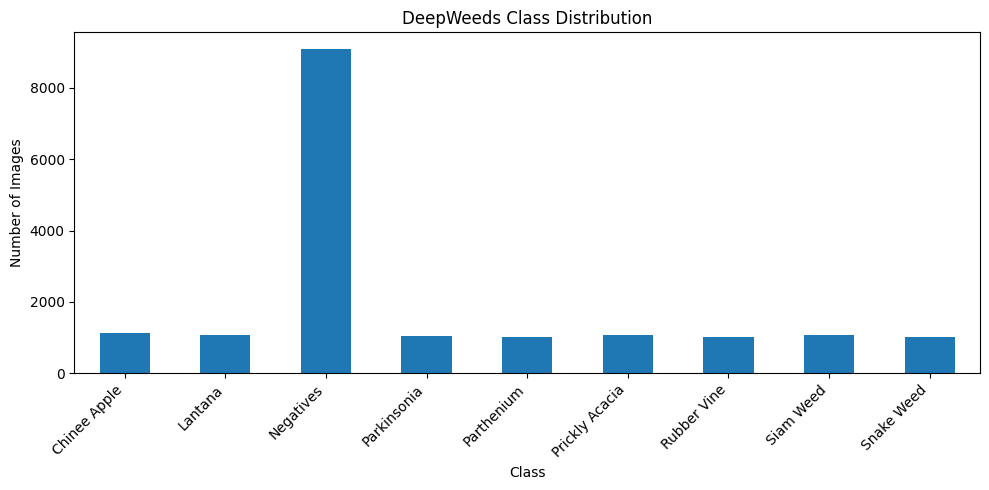

In [12]:
class_counts = df["class_name"].value_counts().sort_index()
print(class_counts)

plt.figure(figsize=(10, 5))
class_counts.plot(kind="bar")
plt.title("DeepWeeds Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [13]:
image_sizes = []

sample_paths = df["image_path"].sample(min(200, len(df)), random_state=SEED)

for path in sample_paths:
    with Image.open(path) as img:
        image_sizes.append(img.size)

size_df = pd.DataFrame(image_sizes, columns=["width", "height"])
size_df.describe()

,width,height
count,200.0,200.0
mean,256.0,256.0
std,0.0,0.0
min,256.0,256.0
25%,256.0,256.0
50%,256.0,256.0
75%,256.0,256.0
max,256.0,256.0


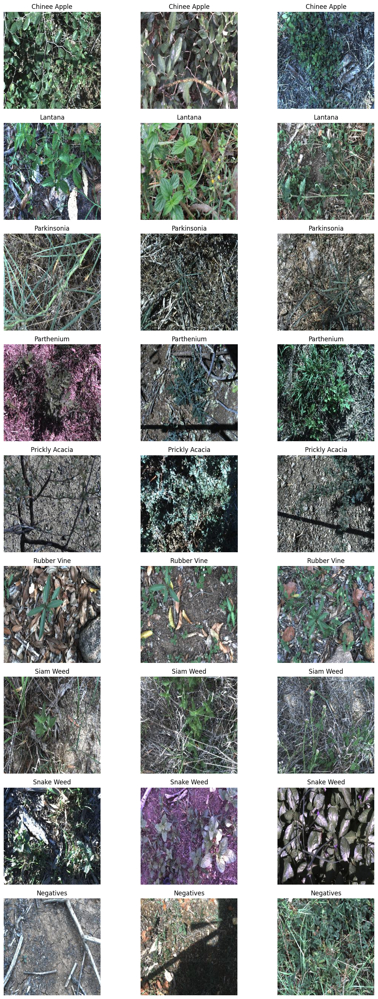

In [14]:
def show_samples(dataframe, samples_per_class=3):
    classes = sorted(dataframe["Label"].unique())
    rows = len(classes)
    cols = samples_per_class

    plt.figure(figsize=(4 * cols, 3 * rows))
    plot_idx = 1

    for cls in classes:
        cls_df = dataframe[dataframe["Label"] == cls]
        cls_samples = cls_df.sample(
            n=min(samples_per_class, len(cls_df)),
            random_state=SEED
        )

        for _, row in cls_samples.iterrows():
            img = Image.open(row["image_path"]).convert("RGB")
            plt.subplot(rows, cols, plot_idx)
            plt.imshow(img)
            plt.title(CLASS_NAMES[int(cls)])
            plt.axis("off")
            plot_idx += 1

    plt.tight_layout()
    plt.show()

show_samples(df, samples_per_class=3)

In [15]:
train_df = pd.read_csv(TRAIN_CSV)
val_df = pd.read_csv(VAL_CSV)
test_df = pd.read_csv(TEST_CSV)

print("Train shape:", train_df.shape)
print("Validation shape:", val_df.shape)
print("Test shape:", test_df.shape)

Train shape: (10501, 2)
Validation shape: (3501, 2)
Test shape: (3507, 2)


In [16]:
for split_df in [train_df, val_df, test_df]:
    split_df["image_path"] = split_df["Filename"].apply(lambda x: os.path.join(IMAGES_DIR, x))
    split_df["class_name"] = split_df["Label"].apply(lambda x: CLASS_NAMES[int(x)])

print("Train images exist:", train_df["image_path"].apply(os.path.exists).all())
print("Val images exist:", val_df["image_path"].apply(os.path.exists).all())
print("Test images exist:", test_df["image_path"].apply(os.path.exists).all())

Train images exist: True
Val images exist: True
Test images exist: True


In [17]:
print("Train size:", len(train_df))
print("Validation size:", len(val_df))
print("Test size:", len(test_df))

Train size: 10501
Validation size: 3501
Test size: 3507


In [18]:
split_summary = pd.DataFrame({
    "train": train_df["class_name"].value_counts().sort_index(),
    "val": val_df["class_name"].value_counts().sort_index(),
    "test": test_df["class_name"].value_counts().sort_index(),
}).fillna(0).astype(int)

split_summary

,train,val,test
class_name,,,
Chinee Apple,675,225,226
Lantana,637,213,213
Negatives,5463,1821,1822
Parkinsonia,618,206,207
Parthenium,613,204,205
Prickly Acacia,637,212,213
Rubber Vine,605,202,202
Siam Weed,644,215,215
Snake Weed,609,203,204


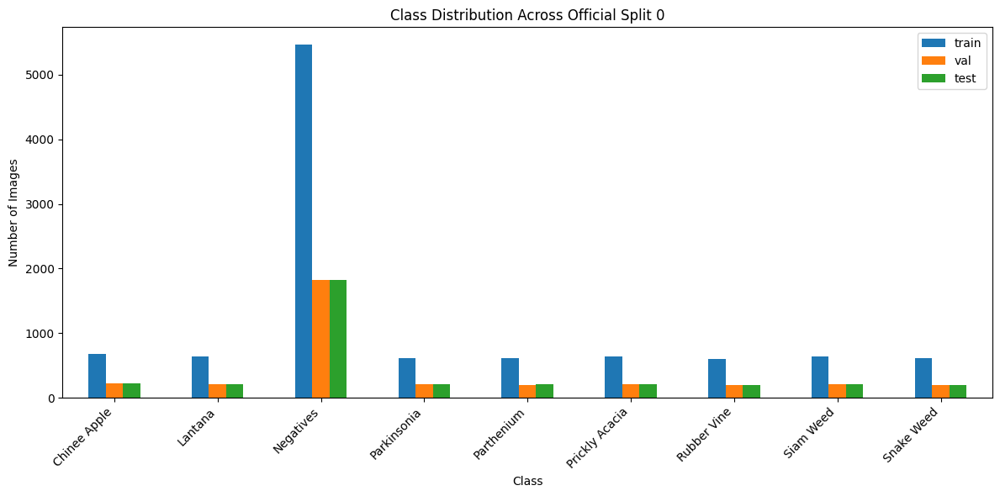

In [19]:
split_summary.plot(kind="bar", figsize=(12, 6))
plt.title("Class Distribution Across Official Split 0")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

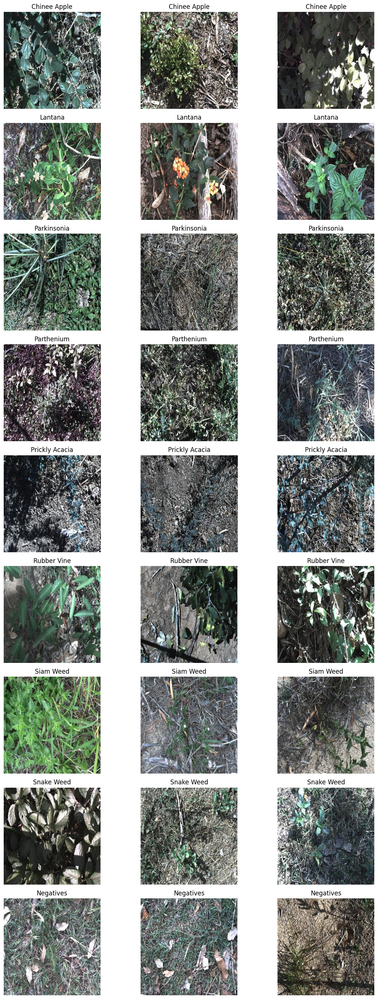

In [20]:
show_samples(train_df, samples_per_class=3)

In [21]:
PROJECT_SPLIT_DIR = "../data/deepweeds/splits"
os.makedirs(PROJECT_SPLIT_DIR, exist_ok=True)

train_df.to_csv(os.path.join(PROJECT_SPLIT_DIR, "train_split.csv"), index=False)
val_df.to_csv(os.path.join(PROJECT_SPLIT_DIR, "val_split.csv"), index=False)
test_df.to_csv(os.path.join(PROJECT_SPLIT_DIR, "test_split.csv"), index=False)

print("Saved project split CSV files.")

Saved project split CSV files.


## Initial Observations

- The dataset contains 17,509 images across 9 classes.
- One class, Negatives, is substantially larger than the weed-species classes, so the dataset is clearly imbalanced.
- The official split preserves a similar class-distribution pattern across train, validation, and test sets.
- Sample images show realistic field conditions, including cluttered backgrounds, variation in lighting, and cases where the weed occupies only part of the image.
- All sampled images are 256 × 256, so resizing to 224 × 224 for model training is reasonable.
- Because of class imbalance, macro F1 and confusion-matrix analysis will be important in addition to accuracy.